# Niobrara Housing Study

Bobbi Pettit, AICP (FIVE RULE Rural Planning)  
Jordan Duffin Wong, Ph.D [](https://orcid.org/0009-0005-6984-2980)

In [ ]:
# These are the R packages used to generate this section.
library(extrafont) # Font manager

Registering fonts with R

Loading required package: ggplot2

Linking to GEOS 3.13.0, GDAL 3.8.5, PROJ 9.5.1; sf_use_s2() is TRUE

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.2.1     ✔ stringr   1.6.0
✔ forcats   1.0.1     ✔ tibble    3.3.1
✔ lubridate 1.9.5     ✔ tidyr     1.3.2
✔ purrr     1.2.2     

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()     masks stats::filter()
✖ dplyr::group_rows() masks kableExtra::group_rows()
✖ dplyr::lag()        masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

all geometries

## Purpose

Upon completion of the Study, the community’s leadership and housing stakeholders should move forward by continuing to take the following steps.

1.  Seek Partnerships: Continue working with other agencies, organizations, and neighboring jurisdictions to leverage resources.
2.  Explore Funding Opportunities: The Federal and State governments understand that the lack of affordable housing is affecting the entire country. As such, Federal and State programs continue to be made available to governments committed to solving housing problems on a local scale. With the knowledge of the state of their community, they must stay informed about programs that provide financial resources or incentives for affordable housing and infrastructure improvements.
3.  Recognize Achievements and Share Best Practices: Recognize and celebrate successful housing development initiatives within the community. Share best practices, lessons learned, and success stories with other cities and regions to promote knowledge sharing, collaborative learning, and mutual growth.

## Process

The Housing Study documents the conditions, statuses, and needs for housing in Niobrara. Drawing on a variety of data from the Knox County, Nebraska Property Assessor, various government agencies, and original surveys of Niobrara residents, we show that Niobrara has a long-term trend of population decline and housing structures in need of improvement.

## Housing Condition and Age

The status and the condition of the residential structures in Knox County are documented by the Knox County Property Assessor. They use five ratings:[1]

1.  **Worn Out**: homes that are in a state of severe disrepair or uninhabitable condition.

2.  **Badly Worn**: homes that have serious deficiencies in systems, such as roofing, plumbing, or electrical foundation. They also show visible deterioration.

3.  **Average**: homes that are habitable and maintain a standard level of functionality. They may lack modern updates or show signs of aging and general wear.

4.  **Good**: homes that are newer, well-maintained, or recently renovated.

5.  **Very Good**: homes that are extremely new, extremely well-maintained, and feature modern amenities and features.

The map below displays the housing conditions in Niobrara.

[1] The Assessor also calculates intermediate ratings, e.g. “Worn Out - Badly Worn.”

In [ ]:
housing_condition <- read_sf(
  dsn = "data/shapefiles/shp-parcel-inventory/shp-parcel-inventory.shp"
) %>%
  filter(
    sprbndr %in%
      c("Niobrara"),
    etj == 1,
    type == "Residential",
    !is.na(conditn)
  ) %>%
  select(Prcl_ID, conditn, geometry) %>%
  rename("Parcel_ID" = "Prcl_ID", "Condition" = "conditn") %>%
  mutate(
    Condition = factor(
      Condition,
      levels = c(
        "Worn-Out",
        "Worn-Out - Badly Worn",
        "Badly Worn",
        "Badly Worn - Average",
        "Average",
        "Average - Good",
        "Good",
        "Good - Very Good",
        "Very Good"
      )
    )
  ) %>%
  st_transform(crs = 4326)

mapview::mapview(
  housing_condition,
  zcol = "Condition",
  map.types = c("CartoDB.Positron", "Esri.WorldImagery"),
  col.regions = c(
    "#3D0C02",
    "#79443B",
    "#FF0800",
    "#FF7F50",
    "#FFBF00",
    "#C0FF00",
    "#32CD32",
    "#01796F",
    "#007FFF"
  ),
  alpha.regions = c(0.75),
  lwd = 1.5,
  layer.name = "Housing Condition"
) +
  mapview::mapview(
    floodplain,
    col.regions = "#007FFF",
    alpha.regions = 0.25,
    layer.name = "Flood Hazard Layer"
  )

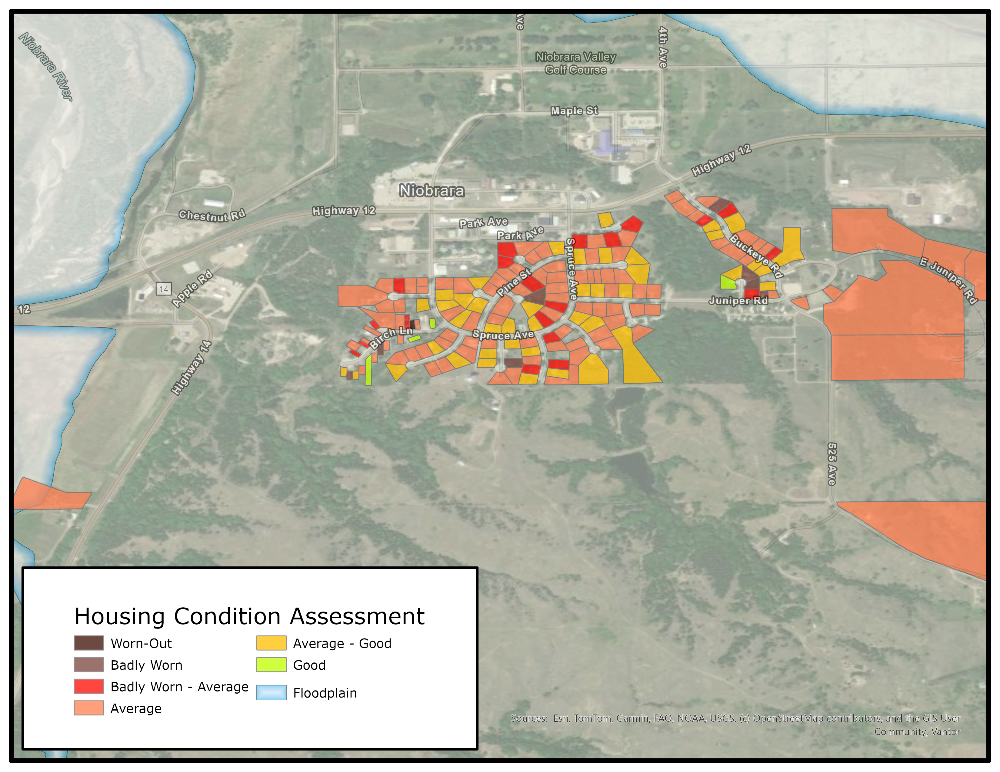{ fig-align="center"}

<br>

In [ ]:
load(file = "Tables/tab_housing_conditions_all.Rda")

kable(tab_housing_condition, align = c("l", "c", "c", "c"), format.args = list(big.mark = ",")) %>%
  kable_styling(bootstrap_options = c("striped", "hover"), position = "left", full_width = F,
                   fixed_thead = T, latex_options = c("striped", "HOLD_position", "repeat_header")) %>%
  row_spec(row = 0, color = "white", background = "gray") %>%
  column_spec(3, width = "12em")

  Condition               Parcels   Area (Square Acres)   Percent of Total Area
  ---------------------- --------- --------------------- -----------------------
  Worn-Out                   1             1.00                   0.07%
  Badly Worn                 8             21.91                  1.44%
  Badly Worn - Average      20             64.97                  4.28%
  Average                   100          1,211.72                79.76%
  Average - Good            43            209.92                 13.82%
  Good                       4             9.65                   0.64%


We have several remarks on the housing conditions in Niobrara:

1.  The overwhelming majority of housing is in **average** condition:
    - About **80%** of the homes in Niobrara are habitable and maintain a standard level of functionality. However, they may lack modern updates or show signs of aging and general wear.
2.  Very few homes are **worn out**:
    - Only **one** home is in a state of severe disrepair or uninhabitable condition.[1] This reflects a minimum standard of basic housing adequacy in Niobrara, with little evidence of total structural abandonment.

    - It also suggests that code enforcement or demolition efforts may be effective in preventing extreme blight.
3.  A very small proportion of houses are **badly worn**:
    - About **1.44%** of the housing stock is assessed as “badly worn” or “badly worn - average.” These homes may have serious deficiencies in systems (such as roofing, plumbing, or electrical foundation) or visible deterioration.

    - This group represents homes that are likely still occupied but nearing the point where repairs and renovation are critical.
4.  A similarly small proportion of houses are **good or better**:
    - Only about **14%** of homes are rated better than “average,” suggesting a small segment of housing stock that is particularly well-maintained, or recently renovated. This could indicate limited recent investment in high-quality residential development or upgrades.

    - It also highlights the need for incentives and programs to support home improvement or new building efforts.

[1] According to the property assessor, at least.

<br>

**Overall Implications for Housing Policy**: Niobrara’s housing stock is in reasonably good condition. Niobrara’s citizens have done a good job of maintaining their residences. For the small amount of housing stock that is rated worse than “average,” Niobrara may benefit from targeted housing rehabilitation programs centered on owner-occupied homes in poor condition. Grant funding and development efforts can be focused on preventing the decline of average-rated homes while prioritizing repairs for the five percent of below-average stock.

The Knox County Property Assessor also documents the age of housing structures. Knowing the age of community housing stock is important because the workable lifespan of a typical house is about one hundred years. Because Niobrara moved to its current location in the 1970s, most of housing stock is much newer than the stock across the rest of Western Knox County. Of note:[1]

> The mighty Missouri again invaded Niobrara in April of 1952 and much of the town and the surrounding area was flooded. This record flow came shortly before the completion of the Missouri River dams, citizens were relieved that flooding along the Missouri would be a thing of the past and life could continue at a more or less routine pace.A big event of the 1950’s was the Centennial Celebration of June 16 – 17, 1956. There were many events leading up to the two day celebration which was attended by an estimated 20,000 people. Later, in the 1950’s and in the 1960’s, it became apparent that the mighty Missouri would, again, influence Niobrara history. Silt from the Niobrara River, which began to accumulate in the river bed, raised the ground water level in Niobrara and the surrounding area. Many basements became flooded requiring constant pumping and it was apparent that the problem would continue to intensify. By 1969, community officials began to look for solutions and a second move.
>
> Funds were appropriated by Congress to pay a sizable portion of the cost of the move. Site preparation began in September of 1973 and was completed in April of 1974. Next came the water, sewer, storm sewer, paving, water wells and water storage tank. The sale of residential lots followed  in the summer of 1974 and residential construction moved forward at a fast pace. By the end of 1977, the move was nearly completed. The 1980 census showed 420 and 213 homes in Niobrara. 1981 marked the 112th anniversary of the original settlement and was celebrated with a historical pageant, parade and other activitiesThrough volunteer efforts, a nine-hole grass greens golf course was completed on the old town site. The Niobrara State Park was relocated, suffering the same fate as the old town. Niobrara’s history can best be summarized as being destined by the mighty Missouri on whose banks it was founded and from whose reach it has continuously tried to escape.

<br>

[1] See [the Village’s History page.](https://niobrarane.com/history/)

In [ ]:
housing_age <- read_sf(
  dsn = "data/shapefiles/shp-parcel-inventory/shp-parcel-inventory.shp"
) %>%
  filter(
    sprbndr %in%
      c("Niobrara"),
    etj == 1,
    type == "Residential",
    !is.na(decade)
  ) %>%
  select(Prcl_ID, decade, geometry) %>%
  rename("Parcel_ID" = "Prcl_ID", "Decade" = "decade") %>%
  mutate(
    Decade = factor(
      Decade,
      levels = c(
        "Before 1900",
        "1900 - 1919",
        "1920 - 1939",
        "1940 - 1959",
        "1960 - 1979",
        "1980 - 1999",
        "2000 or later"
      )
    )
  ) %>%
  st_transform(crs = 4326)

mapview::mapview(
  housing_age,
  zcol = "Decade",
  map.types = c("CartoDB.Positron", "Esri.WorldImagery"),
  col.regions = c(
      "#3D0C02",
      "#FF0800",
      "#FF7F50",
      "#FFBF00",
      "#C0FF00",
      "#32CD32",
      "#01796F"
  ),
  alpha.regions = c(0.75),
  lwd = 1.5,
  layer.name = "Housing Age"
)+
    mapview::mapview(
    floodplain,
    col.regions = "#007FFF",
    alpha.regions = 0.25,
    layer.name = "Flood Hazard Layer"
  )

<br>

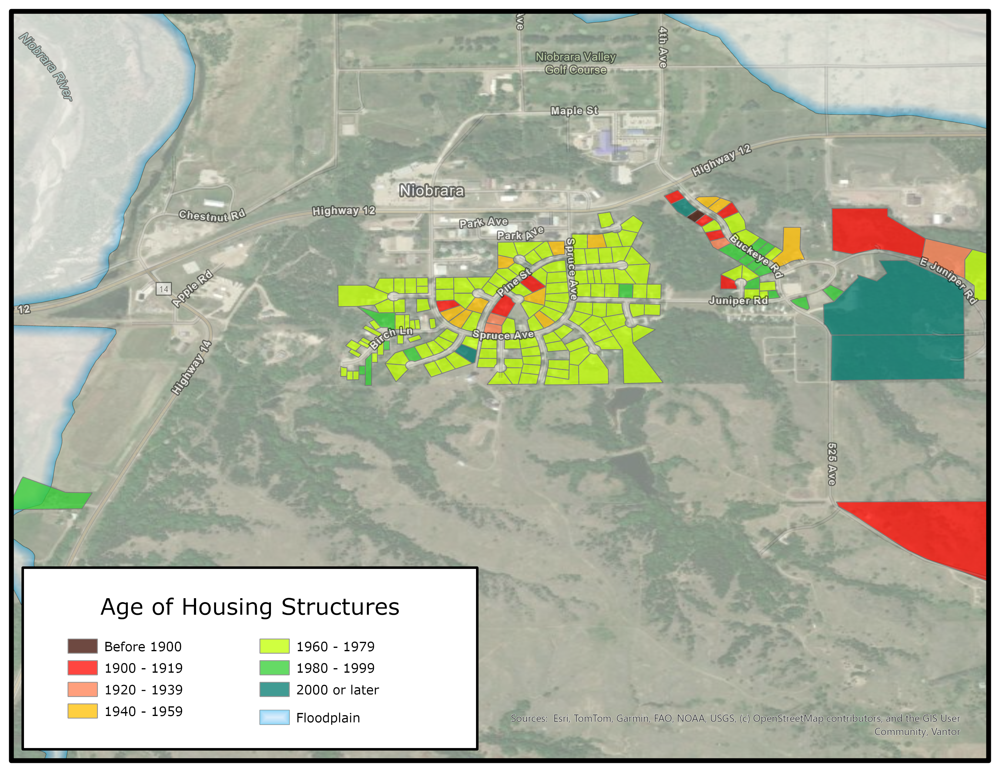{ fig-align="center"}

In [ ]:
load(file = "tables/tab_housing_age_all.Rda")

kable(tab_housing_age, align = c("l", "c", "c", "c"), format.args = list(big.mark = ",")) %>%
  kable_styling(bootstrap_options = c("striped", "hover"), position = "left", full_width = F,
                   fixed_thead = T, latex_options = c("striped", "HOLD_position", "repeat_header")) %>%
  row_spec(row = 0, color = "white", background = "gray") %>%
  column_spec(3, width = "12em")

  Decade Built     Parcels   Area (Square Acres)   Percent of Total Area
  --------------- --------- --------------------- -----------------------
  Before 1900         1             2.47                   0.16%
  1900 - 1919        10            248.90                 16.38%
  1920 - 1939         4             32.93                  2.17%
  1940 - 1959        11             55.86                  3.68%
  1960 - 1979        126           511.32                 33.66%
  1980 - 1999        18             87.25                  5.74%
  2000 or later       6            580.47                 38.21%


<br>

While a number of residential properties predate the 1970s relocation, the vast majority (**80%**) of Niobrara’s homes were built in the last half-century. Because the typical lifespan of a single-family housing unit is roughly 100 years, efforts for residents in homes from the relocation would do well to continue maintaining their properties while keeping an eye on possible deterioration.

## Community Housing Needs

Because of town relocation, Niobrara’s overall population trends should be considered in the context of patterns dating back to the 1970s and 1980s. Although the Village population is declined from its original (post-move) high point in the 1980s, it has remained remarkably consistent since the 1990s, staying between 360 and 380 people.

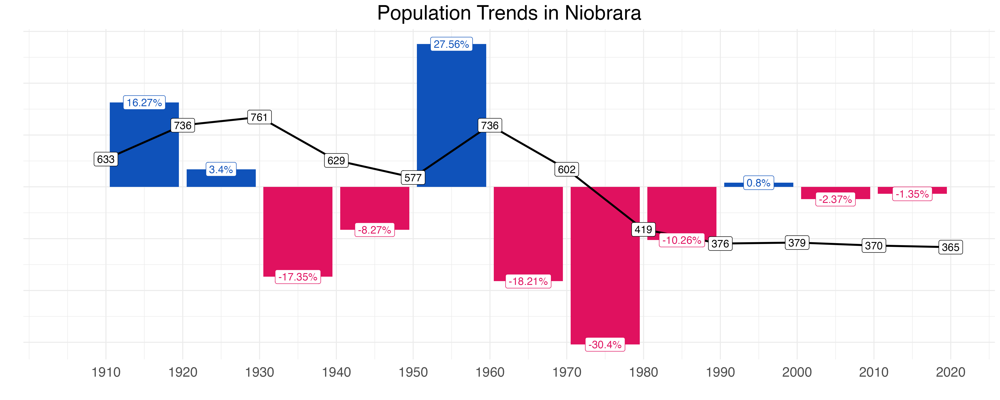{ fig-align="center"}

<br>

We present several possible population scenarios for Niobrara. They range from one-percent annual growth over the next 25 years to one-percent annual decline. Although many factors – some outside of the control of Niobrara residents – influence which scenarios will become reality, many communities express that a target scenario of 0.25% annual growth is a policy goal. Achieving this goal will require Niobrara to maintain and update its housing stock. Allowing the housing stock to stagnate will make the population decline scenarios more likely.

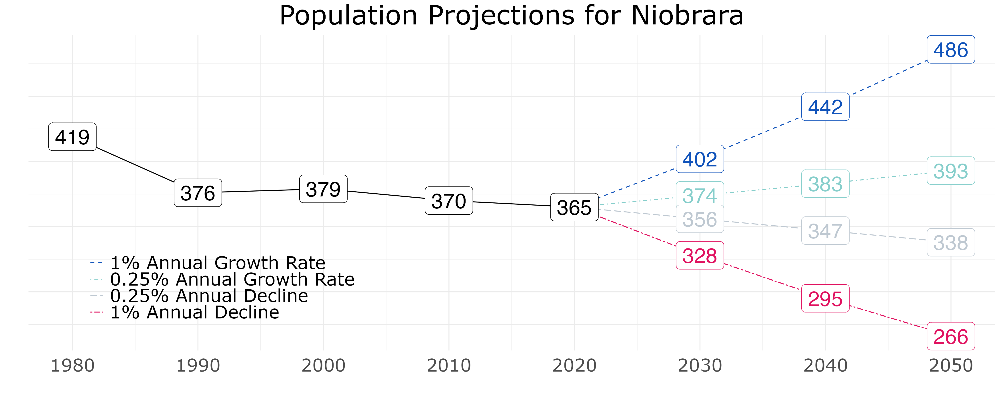{ fig-align="center"}

<br>

The Census defines a family as any two or more people (not necessarily including a householder) residing together and related by birth, marriage, or adoption. A household consists of one or more persons residing together who may or may not be related by birth, marriage, or adoption. Multiple families can reside in the same household.

We show how the average family and household sizes in Niobrara have changed – or rather, not really changed – over the past decade. Both the average family size and average houehold size have increased by marginal amounts. This makes sense given how little the Village’s overall population has changed in recent years.

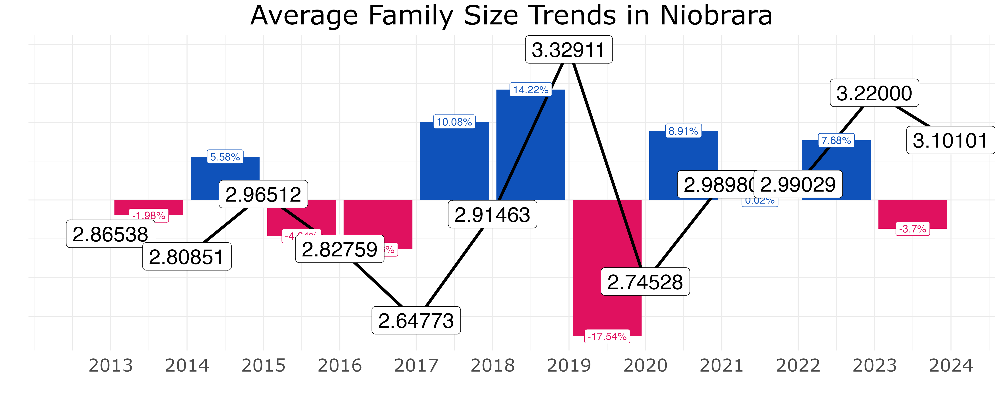{ fig-align="center"}

<br>

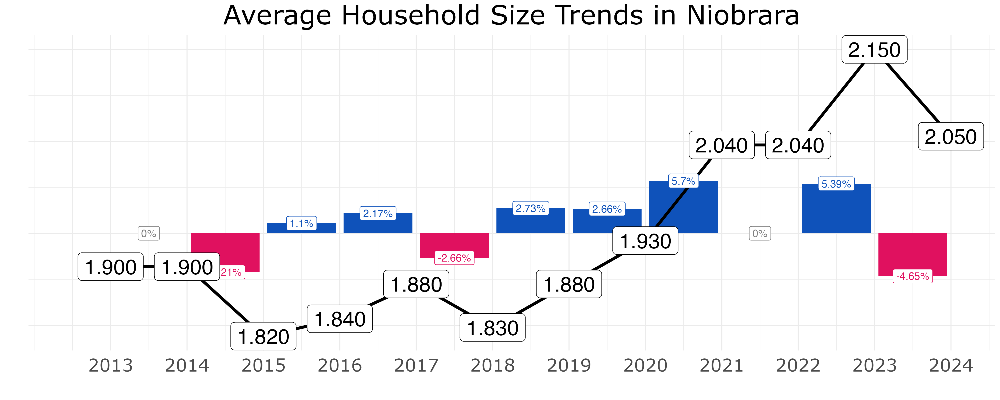{ fig-align="center"}

<br>

We can use these values to project Niobrara’s housing needs over the next several decades. Using the 2024 ACS estimate of 2.05 persons per household, we estimate that, in the 0.25% growth rate scenario Niobrara will need 15 additional houses by 2050, or about one houses every two-to-three years. In the more ambitious 1% growth rate scenario, Niobrara will need 60 additional houses, or about five houses every two years.

These projections do not reflect the necessity of replacing aging housing stock in Niobrara. By 2050, the majority of Niobrara homes will be at or past half of their expected lifespan. In addition to adding new housing units, developers and village officials need a path to turning over existing aging units. In the extreme growth scenario, Niobrara will likely have successfully constructed a number of new housing units where none currently exist and have successfully renovated or replaced aging units.

In [ ]:
load(file = "tables/tab_pop_increase/tab_pop_increase_Niobrara.Rda")

colnames(tab_viz) <- c("", "1% Annual Growth Rate", "0.25% Annual Growth Rate")

tab_viz <- rbind(tab_viz, c("New Housing Units Needed by 2050", "60", "15")) ## Using 2024 average HH size of 2.050

kable(tab_viz, align = c("l", "c", "c", "c"), format.args = list(big.mark = ",")) %>%
  kable_styling(bootstrap_options = c("striped", "hover"), position = "left", full_width = F,
                   fixed_thead = T, latex_options = c("striped", "HOLD_position", "repeat_header")) %>%
  row_spec(row = 0, color = "white", background = "gray") %>%
  row_spec(row = 4, color = "white", background = "gray") %>% 
  column_spec(1:3, width = "12em")

                                      1% Annual Growth Rate   0.25% Annual Growth Rate
  ---------------------------------- ----------------------- --------------------------
  Projected Population in 2040                 442                      383
  Projected Population in 2050                 486                      393
  Population Increase by 2050                  121                       28
  New Housing Units Needed by 2050             60                        15


<br>

Niobrara community leaders should also pay close attention to the community’s demographic distribution when prioritizing housing strategies.

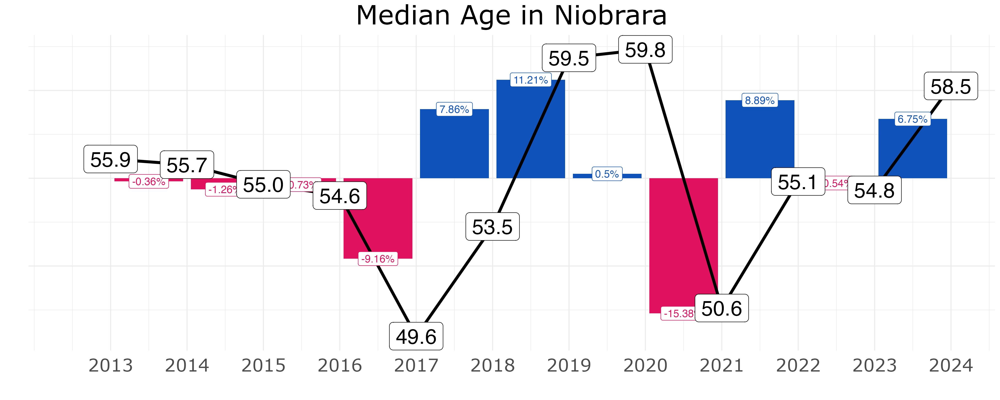

<br>

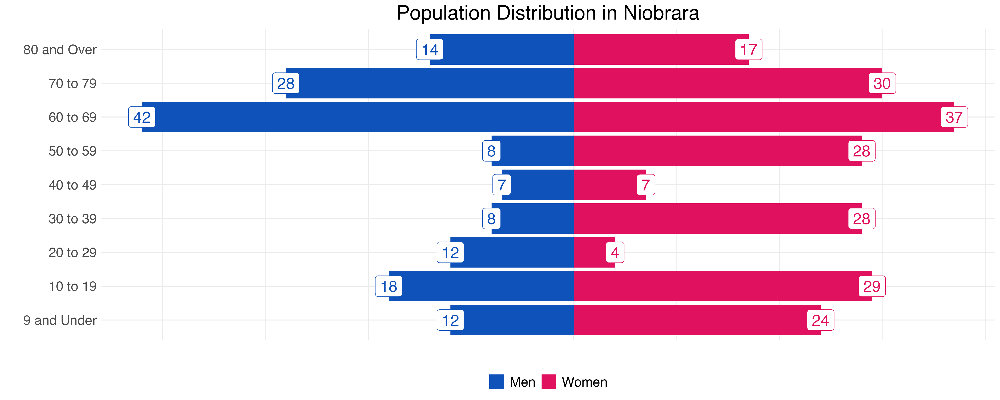

Based on American Community Survey data, the village has a healthy share of residents over the age of 60. If (or as) the share of Niobrara’s residents continues to age, Niobrara homeowners should ensure that homes and public facilities maintain accessibility. Furthermore, if the village is to attract or maintain younger cohorts, it may be wise to pursue the construction of new (and rehabilitation of existing) single-family homes.

## Affordable Housing Assessment

The affordability and accessibility of housing at the right value are paramount. Census data indicate that home values in Niobrara have slowly risen over the past decade. Unfortunately, household incomes have actually fallen over that same time span, possibly due to flooding in 2019 or the COVID-19 pandemic. This indicates that more Niobrara residents, on average, risk being priced out of being able to purchase new homes.

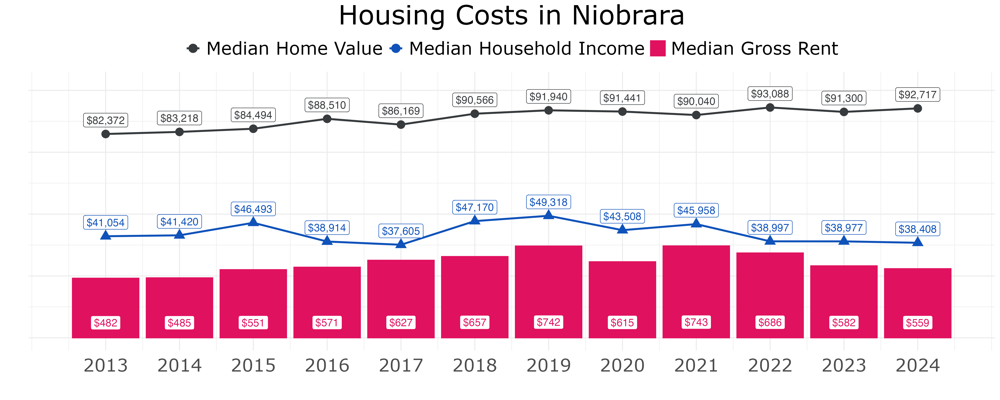

Finally, we show that the current housing inventory is not suited to the income distribution of Niobrara residents. In general, a home is affordable if its value is no more than twice the household income of its resident. For instance, if a household’s income is \$50,000, then the value of their home should be approximately (but not more than) \$100,000. We find that Niobrara has a shortage of 31 units for households eraning at the median income.

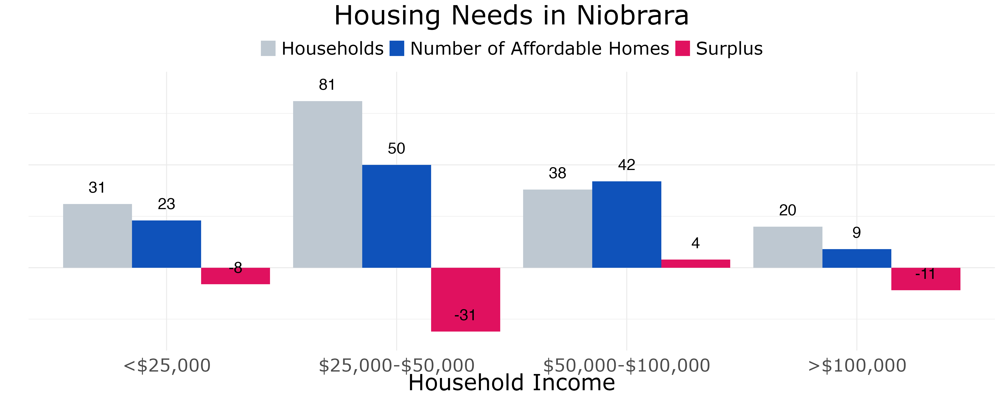

Therefore, when pursuing new housing development, Niobrara needs to emphasize homes whose values address the shortage at the median of the income distribution. While they homes can be costly to produce, doing so will go a long way to remedying the general imbalance between home values and household income capacities.

## Appendix

There are three kinds of data used to generate this Housing Study: community engagement data, socioeconomic data, and map and geospatial data. This appendix documents how these data were acquired, processed, and presented. Finally, it also summarizes the technical procedures used to generate the tangible document of the study.

Please refer any technical questions to [jordan@fiveruleplanning.com](jordan@fiveruleplanning.com).

## Community Engagement Process

\[we haven’t done this yet\]

## Socioeconomic Data Curation

FIVE RULE Rural Planning curated data from a number of sources. In addition to the Community Engagement portion (above), we collected data from the following sources:

1.  2025 U.S. TIGER/Line Shapefiles.
2.  The Knox County, Nebraska Property Assessor.
3.  The University of Nebraska-Omaha Data Center.
4.  The Decennial Census.
5.  The 2013 through 2023 American Community Survey Five-Year Estimates.

## Map Generation

We relied primarily on two softwares to generate maps for this document. For the shapefile generation and curation, we used [R Version 4.5.1](https://www.r-project.org) and the [Positron IDE 2026.06.0 Build 211](https://positron.posit.co/about.html).

## Document Generation

This document was compiled and generated using the [Quarto](https://quarto.org) publishing sytem. All of the source code can be found at the accompanying [GitHub page](https://github.com/five-rule-planning/2026-Niobrara-Housing-Study).

## About the Authors

### Bobbi Pettit, AICP

Bobbi has more than 25 years of experience working with plan creation, plan implementation, and economic development projects across rural Nebraska and Kansas.

Bobbi grew up in Merna, Nebraska, and has experienced firsthand what it’s like to live in a small town. Her passion for helping rural communities runs deep. She founded FIVE RULE Rural Planning (FRRP), in 2018. She earned a Master of Arts in Community & Regional Planning from the University of Nebraska-Lincoln and has been a member of the American Institute of Certified Planners (AICP) since 2011.

Before starting FRRP, Bobbi served as Assistant Development Services Director, City of Kearney; Community Planner, South-Central Economic Development District (SCEDD); Deputy Master Planner, Nebraska Military Department; and 3rd District Staffer for Congressman Tom Osborne.

During her tenure with the City of Kearney, Bobbi oversaw the Planning Commission, Development Review Team, and Chief Building Official. In 2009, Bobbi led 50 troops to Camp Liberty, Iraq, as a Platoon Leader for the Nebraska Army National Guard.

### Jordan Duffin Wong, Ph.D

Jordan brings eight years of cutting-edge computational social science and spatial econometric training to the FIVE RULE team, applying his expertise to curating planning documents for Nebraska communities.

Jordan grew up in Kearney, Nebraska and returned to join FIVE RULE in the summer of 2025. Before, Jordan held positions with Washington University in St. Louis, the Weidenbaum Center on the Economy, Government, and Public Policy, the St. Louis Zoning Atlas, and the Nebraska Bureau of Business Research (BBR).

At BBR, Jordan was a contributor on the inaugural Rural Prosperity Nebraska Thriving Index, and has co-authored numerous scholarly articles on local government, published in both peer-reviewed journals and academic conference proceedings.

Jordan completed two Bachelor of Arts Degrees, in Economics and in Political Science, from the University of Nebraska-Lincoln in 2020, with a minor in Mathematics. In 2025, Jordan completed his Master of Arts and Doctor of Philosophy (Ph.D.), both in Political Science, at Washington University in St. Louis. His classroom experience includes teaching and tutoring a variety of Mathematics, Political Science, and Statistics courses.